In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import random 
import matplotlib.pyplot as plt
import json 
import argparse 
import sys

In [3]:
from rmab.simulator import RMABSimulator, random_valid_transition, random_valid_transition_round_down, synthetic_transition_small_window
from rmab.uc_whittle import UCWhittleBuggy, UCWhittle
from rmab.ucw_value import UCWhittle_value_buggy
from rmab.baselines import optimal_whittle, random_policy, WIQL
from rmab.fr_dynamics import get_all_transitions
from rmab.utils import get_save_path, delete_duplicate_results


In [4]:
is_jupyter = 'ipykernel' in sys.modules

In [5]:
if is_jupyter: 
    seed        = 42
    n_arms      = 8
    budget      = 3
    discount    = 0.9
    alpha       = 3 
    n_episodes  = 30
    episode_len = 20
    n_epochs    = 10
    save_name = 'hyperparameter'
    save_with_date = True 
else:
    parser = argparse.ArgumentParser()
    parser.add_argument('--n_arms',         '-N', help='num beneficiaries (arms)', type=int, default=8)
    parser.add_argument('--episode_len',    '-H', help='episode length', type=int, default=20)
    parser.add_argument('--n_episodes',     '-T', help='num episodes', type=int, default=30)
    parser.add_argument('--budget',         '-B', help='budget', type=int, default=3)
    parser.add_argument('--n_epochs',       '-E', help='number of epochs (num_repeats)', type=int, default=10)
    parser.add_argument('--discount',       '-d', help='discount factor', type=float, default=0.9)
    parser.add_argument('--alpha',          '-a', help='alpha: for conf radius', type=float, default=3)
    parser.add_argument('--seed',           '-s', help='random seed', type=int, default=42)
    parser.add_argument('--save_name',      '-n', help='save name', type=str, default='results')
    parser.add_argument('--use_date', action='store_true')

    args = parser.parse_args()

    n_arms      = args.n_arms
    budget      = args.budget
    discount    = args.discount
    alpha       = args.alpha 
    seed        = args.seed
    n_episodes  = args.n_episodes
    episode_len = args.episode_len
    n_epochs    = args.n_epochs
    save_name   = args.save_name 
    save_with_date = args.use_date 



In [6]:
n_states = 2
n_actions = 2

In [7]:
all_population_size = 100 # number of random arms to generate
all_transitions = random_valid_transition(all_population_size, n_states, n_actions)

In [8]:
all_transitions.shape

(100, 2, 2, 2)

In [9]:
all_features = np.arange(all_population_size)

In [10]:
np.random.seed(seed)
random.seed(seed)
simulator = RMABSimulator(all_population_size, all_features, all_transitions,
            n_arms, episode_len, n_epochs, n_episodes, budget, number_states=n_states)

acting should always be good! 0.829 < 0.857
acting should always be good! 0.940 < 0.950
acting should always be good! 0.865 < 0.901
acting should always be good! 0.958 < 0.992
acting should always be good! 0.990 < 0.992
acting should always be good! 0.933 < 0.982
acting should always be good! 0.994 < 0.996
acting should always be good! 0.882 < 0.954
acting should always be good! 0.926 < 0.932
acting should always be good! 0.610 < 0.856
acting should always be good! 0.765 < 0.991
acting should always be good! 0.637 < 0.986
acting should always be good! 0.875 < 0.923
cohort [83 53 70 45 44 39 22 80]
cohort [45 80  5 29 78 35 86 14]
cohort [42 28 84 76 68 46 97 15]
cohort [51 29 14 74 15  3 31 87]
cohort [55  0 94  4 72 26 38  3]
cohort [69 66 55 63 30 61 42 29]
cohort [83 68 66 27 99 32 35 23]
cohort [31  1 98 11 36  4 84 58]
cohort [ 5 41 86 49 97 13 58 42]
cohort [22 71 78 83 30 48 34 29]


In [11]:
np.random.seed(seed)
random.seed(seed)
random_rewards = random_policy(simulator, n_episodes, n_epochs)

first state [0 1 1 1 1 1 1 1]
instance 0, ep 1, state [0 0 0 1 1 1 0 1]
instance 0, ep 2, state [0 1 1 1 0 0 0 1]
instance 0, ep 3, state [0 0 0 1 0 1 1 0]
instance 0, ep 4, state [1 1 0 1 1 1 1 1]
instance 0, ep 5, state [0 0 0 0 0 1 0 0]
instance 0, ep 6, state [0 1 0 1 0 0 0 0]
instance 0, ep 7, state [1 0 1 0 0 0 0 1]
instance 0, ep 8, state [0 0 0 0 1 1 0 1]
instance 0, ep 9, state [0 1 0 0 0 1 1 1]
instance 0, ep 10, state [0 1 1 0 0 0 1 0]
instance 0, ep 11, state [1 0 1 1 0 1 1 1]
instance 0, ep 12, state [0 0 1 1 0 0 1 0]
instance 0, ep 13, state [1 1 1 1 0 1 1 0]
instance 0, ep 14, state [0 1 1 0 1 1 1 1]
instance 0, ep 15, state [0 0 1 1 1 0 1 1]
instance 0, ep 16, state [1 1 1 1 0 1 1 0]
instance 0, ep 17, state [0 0 0 1 0 0 0 0]
instance 0, ep 18, state [0 1 1 0 1 1 1 0]
instance 0, ep 19, state [1 1 0 1 0 0 1 1]
instance 0, ep 20, state [1 0 0 1 1 0 1 0]
instance 0, ep 21, state [0 1 1 1 0 1 1 1]
instance 0, ep 22, state [0 0 0 0 0 0 0 1]
instance 0, ep 23, state [1 0 0 1

In [12]:
np.random.seed(seed)
random.seed(seed)
optimal_reward = optimal_whittle(simulator, n_episodes, n_epochs, discount)

first state [0 1 1 1 1 1 1 1]
   state [0 1 1 1 1 1 1 1] state_WI [  0.71   0.25   0.21  -0.05   0.56 -10.   -10.   -10.  ] sorted [0 4 1]
   state [1 1 1 1 1 1 1 1] state_WI [  0.32   0.25   0.21  -0.05   0.56 -10.   -10.   -10.  ] sorted [4 0 1]
   state [0 1 1 1 1 1 1 1] state_WI [  0.71   0.25   0.21  -0.05   0.56 -10.   -10.   -10.  ] sorted [0 4 1]
   state [1 1 1 1 1 1 0 1] state_WI [  0.32   0.25   0.21  -0.05   0.56 -10.   -10.   -10.  ] sorted [4 0 1]
   state [1 1 0 1 1 0 1 1] state_WI [  0.32   0.25   0.65  -0.05   0.56   0.48 -10.   -10.  ] sorted [2 4 5]
   state [0 1 1 1 1 1 1 1] state_WI [  0.71   0.25   0.21  -0.05   0.56 -10.   -10.   -10.  ] sorted [0 4 1]
   state [1 1 1 1 0 1 1 1] state_WI [  0.32   0.25   0.21  -0.05   1.   -10.   -10.   -10.  ] sorted [4 0 1]
   state [1 1 1 1 1 1 1 1] state_WI [  0.32   0.25   0.21  -0.05   0.56 -10.   -10.   -10.  ] sorted [4 0 1]
   state [0 1 0 1 1 1 1 1] state_WI [  0.71   0.25   0.65  -0.05   0.56 -10.   -10.   -10.  ] sort

In [13]:
np.random.seed(seed)
random.seed(seed)
wiql_rewards = WIQL(simulator, n_episodes, n_epochs)

first state [0 1 1 1 1 1 1 1]
instance 0, ep 1, state [0 0 0 1 1 1 0 1]
instance 0, ep 2, state [0 1 1 1 0 0 0 1]
instance 0, ep 3, state [0 0 0 1 0 1 1 0]
instance 0, ep 4, state [1 1 0 1 1 1 1 1]
instance 0, ep 5, state [0 0 0 0 0 1 0 0]
instance 0, ep 6, state [0 1 0 1 0 0 0 0]
instance 0, ep 7, state [1 0 1 0 0 0 0 1]
instance 0, ep 8, state [0 0 0 0 1 1 0 1]
instance 0, ep 9, state [0 1 0 0 0 1 1 1]
instance 0, ep 10, state [0 1 1 0 0 0 1 0]
instance 0, ep 11, state [1 0 1 1 0 1 1 1]
instance 0, ep 12, state [0 0 1 1 0 0 1 0]
instance 0, ep 13, state [1 1 1 1 0 1 1 0]
instance 0, ep 14, state [0 1 1 0 1 1 1 1]
instance 0, ep 15, state [0 0 1 1 1 0 1 1]
instance 0, ep 16, state [1 1 1 1 0 1 1 0]
instance 0, ep 17, state [0 0 0 1 0 0 0 0]
instance 0, ep 18, state [0 1 1 0 1 1 1 0]
instance 0, ep 19, state [1 1 0 1 0 0 1 1]
instance 0, ep 20, state [1 0 0 1 1 0 1 0]
instance 0, ep 21, state [0 1 1 1 0 1 1 1]
instance 0, ep 22, state [0 0 0 0 0 0 0 1]
instance 0, ep 23, state [1 0 0 1

In [15]:
np.random.seed(seed)
random.seed(seed)
ucw_extreme_rewards = UCWhittleBuggy(simulator, n_episodes, n_epochs, discount, alpha=alpha, method='extreme')

solving UCWhittle using method: extreme
first state [0 1 1 1 1 1 1 1]
---------------------------------------------------
0 0  | a  [0 0 0 0 0 1 1 1]  | s'  [0 0 1 1 0 1 1 1]  | r  7    | WI  [0.898 0.9   0.9   0.9   0.9   0.9   0.9   0.9  ]
instance 0, ep 1, state [0 0 0 1 1 1 0 1]
instance 0, ep 2, state [0 1 1 1 0 0 0 1]
instance 0, ep 3, state [0 0 0 1 0 1 1 0]
instance 0, ep 4, state [1 1 0 1 1 1 1 1]
instance 0, ep 5, state [0 0 0 0 0 1 0 0]
---------------------------------------------------
0 100  | a  [0 0 1 0 1 0 0 1]  | s'  [0 0 1 1 1 1 1 0]  | r  1    | WI  [  0.898   0.898   0.898   0.879   0.898 -10.    -10.      0.898]
instance 0, ep 6, state [0 1 0 1 0 0 0 0]
instance 0, ep 7, state [1 0 1 0 0 0 0 1]
instance 0, ep 8, state [0 0 0 0 1 1 0 1]
instance 0, ep 9, state [0 1 0 0 0 1 1 1]
instance 0, ep 10, state [0 1 1 0 0 0 1 0]
---------------------------------------------------
0 200  | a  [0 1 1 0 0 0 0 1]  | s'  [1 1 1 0 0 0 1 0]  | r  3    | WI  [  0.898   0.9     0.9 

In [16]:
np.random.seed(seed)
random.seed(seed)
ucw_value_rewards = UCWhittle_value_buggy(simulator, n_episodes, n_epochs, discount, alpha=alpha)

solving UCWhittle using method: VALUE-BASED
first state [0 1 1 1 1 1 1 1]
--------------------------
Restricted license - for non-production use only - expires 2024-10-28


      arm 0 state 0, opt val 7.21, opt p [0.576 0.576 0.889 0.889]
      arm 0 state 1, opt val 8.85, opt p [0.407 0.407 0.932 0.932]
      arm 1 state 0, opt val 7.21, opt p [0. 0. 0. 0.]
      arm 1 state 1, opt val 8.85, opt p [0. 0. 0. 0.]
      arm 2 state 0, opt val 7.21, opt p [0. 0. 0. 0.]
      arm 2 state 1, opt val 8.85, opt p [0. 0. 0. 0.]
      arm 3 state 0, opt val 7.21, opt p [0. 0. 0. 0.]
      arm 3 state 1, opt val 8.85, opt p [0. 0. 0. 0.]
      arm 4 state 0, opt val 7.21, opt p [0. 0. 0. 0.]
      arm 4 state 1, opt val 8.85, opt p [0. 0. 0. 0.]
      arm 5 state 0, opt val 7.21, opt p [0. 0. 0. 0.]
      arm 5 state 1, opt val 8.85, opt p [0. 0. 0. 0.]
      arm 6 state 0, opt val 7.21, opt p [0. 0. 0. 0.]
      arm 6 state 1, opt val 8.85, opt p [0. 0. 0. 0.]
      arm 7 state 0, opt val 7.21, opt p [0. 0. 0. 0.]
      arm 7 state 1, opt val 8.85, opt p [0. 0. 0. 0.]
--------------------------
      arm 0 state 0, opt val 0.00, opt p [-0. -0. -0.  0.]
      arm 

/usr0/home/naveenr/food_rescue_rmab/rmab/ucw_value.py:359: UserWarning: Uh oh! Model is not optimal; status is 11
  warnings.warn(f'Uh oh! Model is not optimal; status is {model.status}')


--------------------------
      arm 0 state 0, opt val 0.00, opt p [0. 0. 0. 0.]
      arm 0 state 1, opt val 1.00, opt p [0. 0. 0. 0.]
      arm 1 state 0, opt val 0.00, opt p [0. 0. 0. 0.]
      arm 1 state 1, opt val 1.00, opt p [0. 0. 0. 0.]
      arm 2 state 0, opt val 0.00, opt p [0. 0. 0. 0.]
      arm 2 state 1, opt val 1.00, opt p [0. 0. 0. 0.]
      arm 3 state 0, opt val 0.00, opt p [0. 0. 0. 0.]
      arm 3 state 1, opt val 1.00, opt p [0. 0. 0. 0.]
      arm 4 state 0, opt val 0.00, opt p [0. 0. 0. 0.]
      arm 4 state 1, opt val 1.00, opt p [0. 0. 0. 0.]
      arm 5 state 0, opt val 0.00, opt p [0. 0. 0. 0.]
      arm 5 state 1, opt val 1.00, opt p [0. 0. 0. 0.]
      arm 6 state 0, opt val 0.00, opt p [0. 0. 0. 0.]
      arm 6 state 1, opt val 1.00, opt p [0. 0. 0. 0.]
      arm 7 state 0, opt val 0.00, opt p [0. 0. 0. 0.]
      arm 7 state 1, opt val 1.00, opt p [0. 0. 0. 0.]
--------------------------
      arm 0 state 0, opt val 0.00, opt p [0. 0. 0. 0.]
      arm 0

/usr0/home/naveenr/food_rescue_rmab/rmab/ucw_value.py:359: UserWarning: Uh oh! Model is not optimal; status is 7
  warnings.warn(f'Uh oh! Model is not optimal; status is {model.status}')


--------------------------
      arm 0 state 0, opt val 0.00, opt p [0. 0. 0. 0.]
      arm 0 state 1, opt val 1.00, opt p [0. 0. 0. 0.]
      arm 1 state 0, opt val 0.00, opt p [0. 0. 0. 0.]
      arm 1 state 1, opt val 1.00, opt p [0. 0. 0. 0.]
      arm 2 state 0, opt val 0.00, opt p [0. 0. 0. 0.]
      arm 2 state 1, opt val 1.00, opt p [0. 0. 0. 0.]
      arm 3 state 0, opt val 0.44, opt p [0.049 0.049 0.058 0.058]
      arm 3 state 1, opt val 1.45, opt p [0.049 0.049 0.058 0.058]
      arm 4 state 0, opt val 0.00, opt p [-0. -0. -0.  0.]
      arm 4 state 1, opt val 1.00, opt p [-0. -0. -0.  0.]
      arm 5 state 0, opt val 0.96, opt p [0.098 0.1   0.098 0.169]
      arm 5 state 1, opt val 2.03, opt p [0.098 0.1   0.098 0.169]
      arm 6 state 0, opt val 0.00, opt p [-0.    -0.     0.009  0.013]
      arm 6 state 1, opt val 1.01, opt p [-0.    -0.     0.009  0.013]
      arm 7 state 0, opt val 0.00, opt p [0. 0. 0. 0.]
      arm 7 state 1, opt val 1.00, opt p [0. 0. 0. 0.]
-----

In [17]:
np.random.seed(seed)
random.seed(seed)
ucw_ucb_rewards = UCWhittleBuggy(simulator, n_episodes, n_epochs, discount, alpha=alpha, method='UCB')

solving UCWhittle using method: UCB
first state [0 1 1 1 1 1 1 1]


---------------------------------------------------
0 0  | a  [0 0 0 0 0 1 1 1]  | s'  [0 0 1 1 0 1 1 1]  | r  7    | WI  [-0. -0. -0. -0. -0. -0. -0. -0.]
instance 0, ep 1, state [0 0 0 1 1 1 0 1]
instance 0, ep 2, state [0 1 1 1 0 0 0 1]
instance 0, ep 3, state [0 0 0 1 0 1 1 0]
instance 0, ep 4, state [1 1 0 1 1 1 1 1]
instance 0, ep 5, state [0 0 0 0 0 1 0 0]
---------------------------------------------------
0 100  | a  [0 0 0 0 0 1 1 1]  | s'  [0 1 1 1 1 1 1 1]  | r  1    | WI  [-0. -0. -0. -0. -0. -0. -0. -0.]
instance 0, ep 6, state [0 1 0 1 0 0 0 0]
instance 0, ep 7, state [1 0 1 0 0 0 0 1]
instance 0, ep 8, state [0 0 0 0 1 1 0 1]
instance 0, ep 9, state [0 1 0 0 0 1 1 1]
instance 0, ep 10, state [0 1 1 0 0 0 1 0]
---------------------------------------------------
0 200  | a  [1 0 0 0 0 0 1 1]  | s'  [0 1 1 1 0 0 1 0]  | r  3    | WI  [ 0.005 -0.    -0.    -0.    -0.    -0.    -0.    -0.   ]
instance 0, ep 11, state [1 0 1 1 0 1 1 1]
instance 0, ep 12, state [0 0 1 1 0 0 1 

In [18]:
np.random.seed(seed)
random.seed(seed)
ucw_qp_rewards = UCWhittleBuggy(simulator, n_episodes, n_epochs, discount, alpha=alpha, method='QP')

solving UCWhittle using method: QP
first state [0 1 1 1 1 1 1 1]
---------------------------------------------------
0 0  | a  [0 0 0 0 0 1 1 1]  | s'  [0 1 1 1 0 1 1 1]  | r  7    | WI  [-1. -1. -1. -1. -1. -1. -1. -1.]


/usr0/home/naveenr/food_rescue_rmab/rmab/uc_whittle.py:561: UserWarning: Uh oh! Model is not optimal; status is 11
  warnings.warn(f'Uh oh! Model is not optimal; status is {model.status}')


instance 0, ep 1, state [0 0 0 1 1 1 0 1]
instance 0, ep 2, state [0 1 1 1 0 0 0 1]
instance 0, ep 3, state [0 0 0 1 0 1 1 0]
instance 0, ep 4, state [1 1 0 1 1 1 1 1]
instance 0, ep 5, state [0 0 0 0 0 1 0 0]
---------------------------------------------------
0 100  | a  [0 0 0 0 0 1 1 1]  | s'  [0 0 0 1 0 1 1 1]  | r  1    | WI  [-1. -1. -1. -1. -1. -1. -1. -1.]
instance 0, ep 6, state [0 1 0 1 0 0 0 0]
instance 0, ep 7, state [1 0 1 0 0 0 0 1]
instance 0, ep 8, state [0 0 0 0 1 1 0 1]
instance 0, ep 9, state [0 1 0 0 0 1 1 1]
instance 0, ep 10, state [0 1 1 0 0 0 1 0]
---------------------------------------------------
0 200  | a  [0 0 0 0 0 1 1 1]  | s'  [0 1 0 1 0 1 1 1]  | r  3    | WI  [-1. -1. -1. -1. -1. -1. -1. -1.]
instance 0, ep 11, state [1 0 1 1 0 1 1 1]
instance 0, ep 12, state [0 0 1 1 0 0 1 0]
instance 0, ep 13, state [1 1 1 1 0 1 1 0]
instance 0, ep 14, state [0 1 1 0 1 1 1 1]
instance 0, ep 15, state [0 0 1 1 1 0 1 1]
------------------------------------------------

In [19]:
np.random.seed(seed)
random.seed(seed)
ucw_ucb_rewards_fixed = UCWhittle(simulator, n_episodes, n_epochs, discount, alpha=alpha, method='UCB')

solving UCWhittle using method: UCB
first state [0 1 1 1 1 1 1 1]
---------------------------------------------------
0 0  | a  [0 0 0 0 0 1 1 1]  | s'  [0 0 1 1 0 1 1 1]  | r  7    | WI  [-0. -0. -0. -0. -0. -0. -0. -0.]
instance 0, ep 1, state [0 0 0 1 1 1 0 1]
instance 0, ep 2, state [0 1 1 1 0 0 0 1]
instance 0, ep 3, state [0 0 0 1 0 1 1 0]
instance 0, ep 4, state [1 1 0 1 1 1 1 1]
instance 0, ep 5, state [0 0 0 0 0 1 0 0]
---------------------------------------------------
0 100  | a  [0 1 1 0 0 0 1 0]  | s'  [1 1 0 1 0 1 0 1]  | r  1    | WI  [-10.      0.757   0.839  -0.      0.478  -0.      0.741 -10.   ]
instance 0, ep 6, state [0 1 0 1 0 0 0 0]
instance 0, ep 7, state [1 0 1 0 0 0 0 1]
instance 0, ep 8, state [0 0 0 0 1 1 0 1]
instance 0, ep 9, state [0 1 0 0 0 1 1 1]
instance 0, ep 10, state [0 1 1 0 0 0 1 0]
---------------------------------------------------
0 200  | a  [0 1 0 0 1 1 0 0]  | s'  [1 1 0 1 1 1 1 0]  | r  3    | WI  [  0.056   0.148   0.139  -0.      0.558   

In [20]:
x_vals = np.arange(n_episodes * episode_len + 1)

In [33]:
def get_cum_sum(reward):
        cum_sum = reward.cumsum(axis=1).mean(axis=0)
        cum_sum = cum_sum / (x_vals[1:] + 1)
        return smooth(cum_sum)
def smooth(rewards, weight=0.7):
    """ smoothed exponential moving average """
    prev = rewards[0]
    smoothed = np.zeros(len(rewards))
    for i, val in enumerate(rewards):
        smoothed_val = prev * weight + (1 - weight) * val
        smoothed[i] = smoothed_val
        prev = smoothed_val

    return smoothed

In [34]:
use_algos = ['optimal', 'ucw_ucb', 'ucw_qp', 'ucw_extreme', 'wiql', 'random', 'fixed']
rewards = {
    'optimal': optimal_reward,
    'ucw_qp': ucw_qp_rewards, 
    'ucw_extreme': ucw_extreme_rewards, 
    'wiql': wiql_rewards, 
    'random': random_rewards, 
    'fixed': ucw_ucb_rewards_fixed,  
    'ucw_ucb': ucw_ucb_rewards, 
}
colors = {'optimal': 'purple', 'ucw_value': 'b', 'ucw_qp': 'c', 'ucw_qp_min': 'goldenrod', 'ucw_ucb': 'darkorange',
                'ucw_extreme': 'r', 'wiql': 'limegreen', 'random': 'brown', 'fixed': 'goldenrod'}

In [35]:
cum_sum_by_algo = {}
for algo in use_algos:
    cum_sum_by_algo[algo] = get_cum_sum(rewards[algo])

mean_by_algo = {}
for algo in use_algos: 
    mean_by_algo[algo] = rewards[algo].mean(axis=0)

ValueError: x and y must have same first dimension, but have shapes (601,) and (600,)

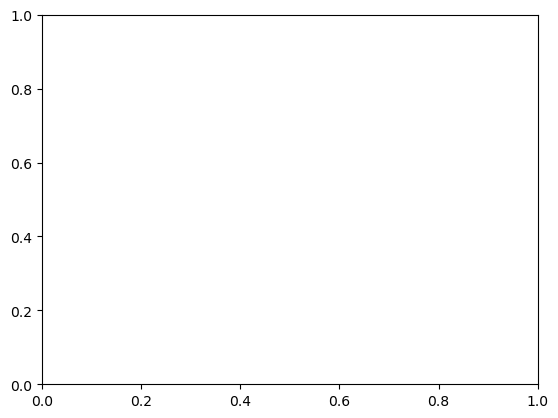

In [36]:
for algo in use_algos:
    plt.plot(x_vals, get_cum_sum(rewards[algo]), c=colors[algo], label=algo)
plt.legend()

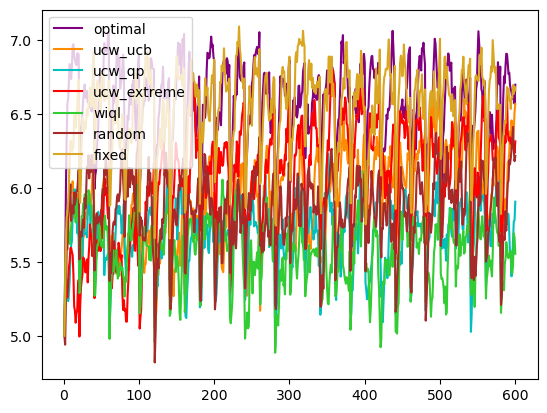

In [38]:
for algo in use_algos:
    plt.plot(x_vals[1:], smooth(rewards[algo].mean(axis=0)), c=colors[algo], label=algo)
plt.legend()

In [39]:
for i in cum_sum_by_algo:
    cum_sum_by_algo[i] = cum_sum_by_algo[i].tolist() 
    mean_by_algo[i] = mean_by_algo[i].tolist() 

In [51]:
data = {
    'cum_sum': cum_sum_by_algo,
    'mean_rewards': mean_by_algo,  
    'parameters': 
    {'seed'      : seed,
    'n_arms'    : n_arms,
    'budget'    : budget,
    'discount'  : discount, 
    'alpha'     : alpha, 
    'n_episodes': n_episodes, 
    'episode_len': episode_len, 
    'n_epochs'  : n_epochs} 
}

In [52]:
save_path = get_save_path('replication',save_name,seed,use_date=False)

In [53]:
delete_duplicate_results('replication',save_name,data)

In [54]:
json.dump(data,open('../results/'+save_path,'w'))